# Exploratory Data Analysis (EDA)

## Import Library

In [1]:
import pandas as pd
import numpy as np
from scipy import stats
from collections import Counter
import matplotlib.pylab as plt
import seaborn as sns

## Environment Variable Setting

In [2]:
#pd.set_option('display.width', 100)
pd.set_option('precision', 4)

## Load Dataset

In [3]:
missing_values = ["n/a", "na", "--", "?"]

In [4]:
df = pd.read_csv('Data/lending_club_loan_two.csv',na_values = missing_values)

## Descriptive Statistics 

### Peek at Your Data

In [5]:
df.head(5)

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
0,10000.0,36 months,11.44,329.48,B,B4,Marketing,10+ years,RENT,117000.0,...,16.0,0.0,36369.0,41.8,25.0,w,INDIVIDUAL,0.0,0.0,"0174 Michelle Gateway\r\nMendozaberg, OK 22690"
1,8000.0,36 months,11.99,265.68,B,B5,Credit analyst,4 years,MORTGAGE,65000.0,...,17.0,0.0,20131.0,53.3,27.0,f,INDIVIDUAL,3.0,0.0,"1076 Carney Fort Apt. 347\r\nLoganmouth, SD 05113"
2,15600.0,36 months,10.49,506.97,B,B3,Statistician,< 1 year,RENT,43057.0,...,13.0,0.0,11987.0,92.2,26.0,f,INDIVIDUAL,0.0,0.0,"87025 Mark Dale Apt. 269\r\nNew Sabrina, WV 05113"
3,7200.0,36 months,6.49,220.65,A,A2,Client Advocate,6 years,RENT,54000.0,...,6.0,0.0,5472.0,21.5,13.0,f,INDIVIDUAL,0.0,0.0,"823 Reid Ford\r\nDelacruzside, MA 00813"
4,24375.0,60 months,17.27,609.33,C,C5,Destiny Management Inc.,9 years,MORTGAGE,55000.0,...,13.0,0.0,24584.0,69.8,43.0,f,INDIVIDUAL,1.0,0.0,"679 Luna Roads\r\nGreggshire, VA 11650"


In [6]:
df.tail(5)

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
396025,10000.0,60 months,10.99,217.38,B,B4,licensed bankere,2 years,RENT,40000.0,...,6.0,0.0,1990.0,34.3,23.0,w,INDIVIDUAL,0.0,0.0,"12951 Williams Crossing\r\nJohnnyville, DC 30723"
396026,21000.0,36 months,12.29,700.42,C,C1,Agent,5 years,MORTGAGE,110000.0,...,6.0,0.0,43263.0,95.7,8.0,f,INDIVIDUAL,1.0,0.0,"0114 Fowler Field Suite 028\r\nRachelborough, ..."
396027,5000.0,36 months,9.99,161.32,B,B1,City Carrier,10+ years,RENT,56500.0,...,15.0,0.0,32704.0,66.9,23.0,f,INDIVIDUAL,0.0,0.0,"953 Matthew Points Suite 414\r\nReedfort, NY 7..."
396028,21000.0,60 months,15.31,503.02,C,C2,"Gracon Services, Inc",10+ years,MORTGAGE,64000.0,...,9.0,0.0,15704.0,53.8,20.0,f,INDIVIDUAL,5.0,0.0,"7843 Blake Freeway Apt. 229\r\nNew Michael, FL..."
396029,2000.0,36 months,13.61,67.98,C,C2,Internal Revenue Service,10+ years,RENT,42996.0,...,3.0,0.0,4292.0,91.3,19.0,f,INDIVIDUAL,NaN,0.0,"787 Michelle Causeway\r\nBriannaton, AR 48052"


In [7]:
df.sample(20)

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
175334,10000.0,60 months,17.57,251.61,D,D4,Nurse,10+ years,MORTGAGE,88000.0,...,14.0,0.0,21696.0,56.1,45.0,w,INDIVIDUAL,3.0,0.0,"68779 Burnett Circle\r\nWest Cherylton, SC 48052"
113431,9600.0,36 months,10.99,314.25,B,B2,PAINTER HELPER,4 years,RENT,35000.0,...,9.0,0.0,7309.0,47.5,11.0,f,INDIVIDUAL,0.0,0.0,"9819 Ramos Camp\r\nLake John, WV 86630"
390372,8000.0,36 months,6.49,245.16,A,A2,Procurement Forester,2 years,MORTGAGE,77900.0,...,9.0,2.0,10277.0,55.6,18.0,f,INDIVIDUAL,2.0,0.0,26419 Campbell Spur Apt. 507\r\nChristopherche...
267427,12000.0,36 months,6.03,365.23,A,A1,Senior Consultant,3 years,MORTGAGE,85000.0,...,10.0,0.0,6681.0,8.6,28.0,w,INDIVIDUAL,3.0,0.0,"791 Tara Coves Suite 753\r\nSouth Patricia, KS..."
350784,35000.0,36 months,14.47,1204.23,C,C2,Accountant,6 years,MORTGAGE,93000.0,...,23.0,0.0,50400.0,48.4,30.0,f,INDIVIDUAL,2.0,0.0,"82915 Osborn River Suite 842\r\nCortezmouth, M..."
223811,35000.0,60 months,15.41,840.20,D,D1,Chief Knowledge Officer,10+ years,RENT,120000.0,...,8.0,0.0,26046.0,56.5,23.0,w,INDIVIDUAL,5.0,0.0,0144 Garcia Grove Suite 022\r\nLake Shawnchest...
376322,5000.0,36 months,7.12,154.66,A,A3,Process Engineer,6 years,OWN,90000.0,...,6.0,0.0,3329.0,9.1,15.0,w,INDIVIDUAL,0.0,0.0,78074 Conner Circles Apt. 845\r\nLake Trevorto...
233936,13200.0,36 months,16.29,465.97,D,D1,Nipro Diagnostics,2 years,RENT,128800.0,...,11.0,0.0,18540.0,86.6,16.0,f,INDIVIDUAL,NaN,0.0,"83778 Fernandez Grove\r\nNew Robert, MI 05113"
96677,6625.0,36 months,17.76,238.72,D,D1,Business Manager,< 1 year,MORTGAGE,69000.0,...,10.0,0.0,3072.0,93.1,18.0,f,INDIVIDUAL,0.0,0.0,"36323 Lewis Summit Suite 035\r\nEast Timothy, ..."
2491,5500.0,36 months,12.99,185.30,B,B4,Salesperson,2 years,RENT,90000.0,...,15.0,0.0,9354.0,64.5,24.0,w,INDIVIDUAL,0.0,0.0,"324 Mary Plaza Apt. 090\r\nKeithview, WV 30723"


### Dimensions of Your Data

In [8]:
print(df.shape)

(396030, 27)


### Data Type For Each Attribute

In [9]:
df.dtypes

loan_amnt               float64
term                     object
int_rate                float64
installment             float64
grade                    object
sub_grade                object
emp_title                object
emp_length               object
home_ownership           object
annual_inc              float64
verification_status      object
issue_d                  object
loan_status              object
purpose                  object
title                    object
dti                     float64
earliest_cr_line         object
open_acc                float64
pub_rec                 float64
revol_bal               float64
revol_util              float64
total_acc               float64
initial_list_status      object
application_type         object
mort_acc                float64
pub_rec_bankruptcies    float64
address                  object
dtype: object

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396030 entries, 0 to 396029
Data columns (total 27 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   loan_amnt             396030 non-null  float64
 1   term                  396030 non-null  object 
 2   int_rate              396030 non-null  float64
 3   installment           396030 non-null  float64
 4   grade                 396030 non-null  object 
 5   sub_grade             396030 non-null  object 
 6   emp_title             373100 non-null  object 
 7   emp_length            377729 non-null  object 
 8   home_ownership        396030 non-null  object 
 9   annual_inc            396030 non-null  float64
 10  verification_status   396030 non-null  object 
 11  issue_d               396030 non-null  object 
 12  loan_status           396030 non-null  object 
 13  purpose               396030 non-null  object 
 14  title                 394275 non-null  object 
 15  

In [11]:
bool_col = df.select_dtypes(['bool']).columns
bool_col

Index([], dtype='object')

In [12]:
object_col = df.select_dtypes(['object']).columns
object_col

Index(['term', 'grade', 'sub_grade', 'emp_title', 'emp_length',
       'home_ownership', 'verification_status', 'issue_d', 'loan_status',
       'purpose', 'title', 'earliest_cr_line', 'initial_list_status',
       'application_type', 'address'],
      dtype='object')

### Basic Statistics

In [13]:
df.describe()

,loan_amnt,int_rate,installment,annual_inc,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies
count,396030.0000,396030.0000,396030.0000,3.9603e+05,396030.0000,396030.0000,396030.0000,3.9603e+05,395754.0000,396030.0000,358235.0000,395495.0000
mean,14113.8881,13.6394,431.8497,7.4203e+04,17.3795,11.3112,0.1782,1.5845e+04,53.7917,25.4147,1.8140,0.1216
std,8357.4413,4.4722,250.7278,6.1638e+04,18.0191,5.1376,0.5307,2.0592e+04,24.4522,11.8870,2.1479,0.3562
min,500.0000,5.3200,16.0800,0.0000e+00,0.0000,0.0000,0.0000,0.0000e+00,0.0000,2.0000,0.0000,0.0000
25%,8000.0000,10.4900,250.3300,4.5000e+04,11.2800,8.0000,0.0000,6.0250e+03,35.8000,17.0000,0.0000,0.0000
50%,12000.0000,13.3300,375.4300,6.4000e+04,16.9100,10.0000,0.0000,1.1181e+04,54.8000,24.0000,1.0000,0.0000
75%,20000.0000,16.4900,567.3000,9.0000e+04,22.9800,14.0000,0.0000,1.9620e+04,72.9000,32.0000,3.0000,0.0000
max,40000.0000,30.9900,1533.8100,8.7066e+06,9999.0000,90.0000,86.0000,1.7433e+06,892.3000,151.0000,34.0000,8.0000


In [14]:
df.describe(include="all").transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
loan_amnt,3.96e+05,NaN,NaN,NaN,1.411e+04,8357,500,8000,1.2e+04,2e+04,4e+04
term,396030,2,36 months,302005,NaN,NaN,NaN,NaN,NaN,NaN,NaN
int_rate,3.96e+05,NaN,NaN,NaN,13.64,4.472,5.32,10.49,13.33,16.49,30.99
installment,3.96e+05,NaN,NaN,NaN,431.8,250.7,16.08,250.3,375.4,567.3,1534
grade,396030,7,B,116018,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sub_grade,396030,35,B3,26655,NaN,NaN,NaN,NaN,NaN,NaN,NaN
emp_title,373100,173104,Teacher,4389,NaN,NaN,NaN,NaN,NaN,NaN,NaN
emp_length,377729,11,10+ years,126041,NaN,NaN,NaN,NaN,NaN,NaN,NaN
home_ownership,396030,6,MORTGAGE,198348,NaN,NaN,NaN,NaN,NaN,NaN,NaN
annual_inc,3.96e+05,NaN,NaN,NaN,7.42e+04,6.164e+04,0,4.5e+04,6.4e+04,9e+04,8.707e+06


* Look at the unique values (for categorical this will show up as NaN). 
* If a feature has only 1 unique value it will not help to model, so discard it.
* Look at the ranges of the values. If the max or min of a feature is significantly different from the mean and from the 75% / 25%, then look into this further to understand if these values make sense in their context.

In [15]:
#data_fifa.describe(include="all").transpose()
numeric_columns = df.describe(percentiles=[.1, .25, .5, .75, .9],exclude='O').transpose()
numeric_columns

,count,mean,std,min,10%,25%,50%,75%,90%,max
loan_amnt,396030.0,14113.8881,8357.4413,500.00,5000.00,8000.00,12000.00,20000.00,26000.00,4.0000e+04
int_rate,396030.0,13.6394,4.4722,5.32,7.89,10.49,13.33,16.49,19.52,3.0990e+01
installment,396030.0,431.8497,250.7278,16.08,158.86,250.33,375.43,567.30,785.48,1.5338e+03
annual_inc,396030.0,74203.1758,61637.6212,0.00,34000.00,45000.00,64000.00,90000.00,120000.00,8.7066e+06
dti,396030.0,17.3795,18.0191,0.00,6.90,11.28,16.91,22.98,28.50,9.9990e+03
open_acc,396030.0,11.3112,5.1376,0.00,6.00,8.00,10.00,14.00,18.00,9.0000e+01
pub_rec,396030.0,0.1782,0.5307,0.00,0.00,0.00,0.00,0.00,1.00,8.6000e+01
revol_bal,396030.0,15844.5399,20591.8361,0.00,3091.00,6025.00,11181.00,19620.00,31470.00,1.7433e+06
revol_util,395754.0,53.7917,24.4522,0.00,19.70,35.80,54.80,72.90,86.20,8.9230e+02
total_acc,396030.0,25.4147,11.8870,2.00,12.00,17.00,24.00,32.00,41.00,1.5100e+02


In [16]:
df.describe()["loan_amnt"]

count    396030.0000
mean      14113.8881
std        8357.4413
min         500.0000
25%        8000.0000
50%       12000.0000
75%       20000.0000
max       40000.0000
Name: loan_amnt, dtype: float64

In [17]:
df.describe()["loan_amnt"]["75%"]

20000.0

In [18]:
numeric_features = numeric_columns.index.to_list()
numeric_features

['loan_amnt',
 'int_rate',
 'installment',
 'annual_inc',
 'dti',
 'open_acc',
 'pub_rec',
 'revol_bal',
 'revol_util',
 'total_acc',
 'mort_acc',
 'pub_rec_bankruptcies']

In [19]:
categorical_columns = df.describe(include='O').transpose()
categorical_columns

,count,unique,top,freq
term,396030,2,36 months,302005
grade,396030,7,B,116018
sub_grade,396030,35,B3,26655
emp_title,373100,173104,Teacher,4389
emp_length,377729,11,10+ years,126041
home_ownership,396030,6,MORTGAGE,198348
verification_status,396030,3,Verified,139563
issue_d,396030,115,Oct-2014,14846
loan_status,396030,2,Fully Paid,318357
purpose,396030,14,debt_consolidation,234507


* unique: If a feature has only 1 unique value it will not help to model, so discard it.
* top: Most commonly occuring value among all values in a column. 
* freq: Frequency (or count of occurance) of most commonly occuring value among all values in a column. 

In [20]:
categorical_features = categorical_columns.index.to_list()
categorical_features

['term',
 'grade',
 'sub_grade',
 'emp_title',
 'emp_length',
 'home_ownership',
 'verification_status',
 'issue_d',
 'loan_status',
 'purpose',
 'title',
 'earliest_cr_line',
 'initial_list_status',
 'application_type',
 'address']

### Duplicate Rows

In [21]:
df.duplicated().sum()

0

No duplicate rows are present in the data

### Missing Values 

In [22]:
df.isna().sum().sum()

81592

In [23]:
df.isnull().sum().sum()

81592

In [24]:
null_columns = {}

all_columns = df.isnull().sum().sort_values(ascending=False)
for item in all_columns.index:
    if all_columns[item] > 0:
        null_columns[item] = 100* all_columns[item]/len(df)
        
null_columns

{'mort_acc': 9.54346892912153,
 'emp_title': 5.7899654066611115,
 'emp_length': 4.621114562028129,
 'title': 0.44314824634497385,
 'pub_rec_bankruptcies': 0.13509077595131683,
 'revol_util': 0.06969169002348306}

### Minimum = 0, in Numeric Column

In [25]:
statistics = df.describe()
min_value_zero_columns = [item for item in statistics if statistics[item]['min'] == 0]
min_value_zero_columns

['annual_inc',
 'dti',
 'open_acc',
 'pub_rec',
 'revol_bal',
 'revol_util',
 'mort_acc',
 'pub_rec_bankruptcies']

### Class Distribution (Classification Only)

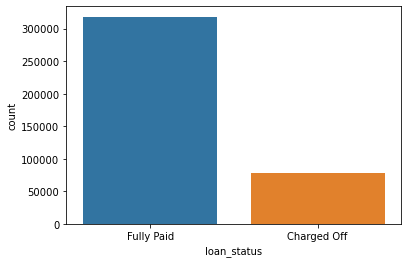

In [26]:
sns.countplot(x='loan_status',data=df);

In [27]:
df['loan_status'].value_counts().size

2

In [28]:
df['loan_status'].value_counts()

Fully Paid     318357
Charged Off     77673
Name: loan_status, dtype: int64

* Fully Paid ->   318357  [Majority/Negative Class]
* Charged Off ->   77673  [Minority/Positive Class]

#### Weight Calculation

weight = total negative examples/total positive examples

In [29]:
def calculate_weight():
    y = df['loan_status'].map({'Fully Paid':0,'Charged Off':1})
    counter = Counter(y)
    for k,v in counter.items():
        per = v / len(y) * 100
        print('Class=%s, Count=%d, Percentage=%.3f%%' % (k, v, per))
    weight = counter[0] / counter[1]
    return weight

In [30]:
weight = calculate_weight()
print(weight)

Class=0, Count=318357, Percentage=80.387%
Class=1, Count=77673, Percentage=19.613%
4.098682940017767


* Most of the contemporary works in class imbalance concentrate on imbalance ratios ranging from 1:4 up to 1:100.

## Distributions

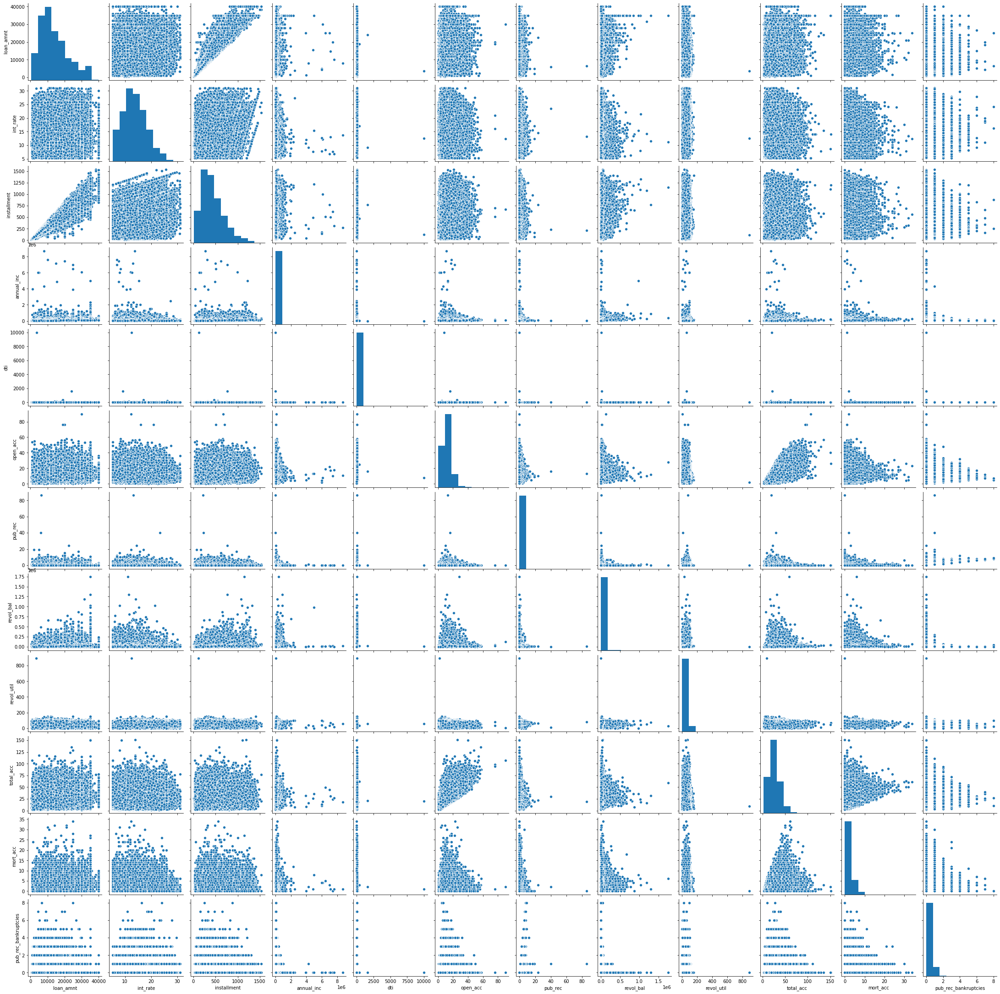

In [31]:
#plt.figure(figsize=(12,6))
sns.pairplot(df);

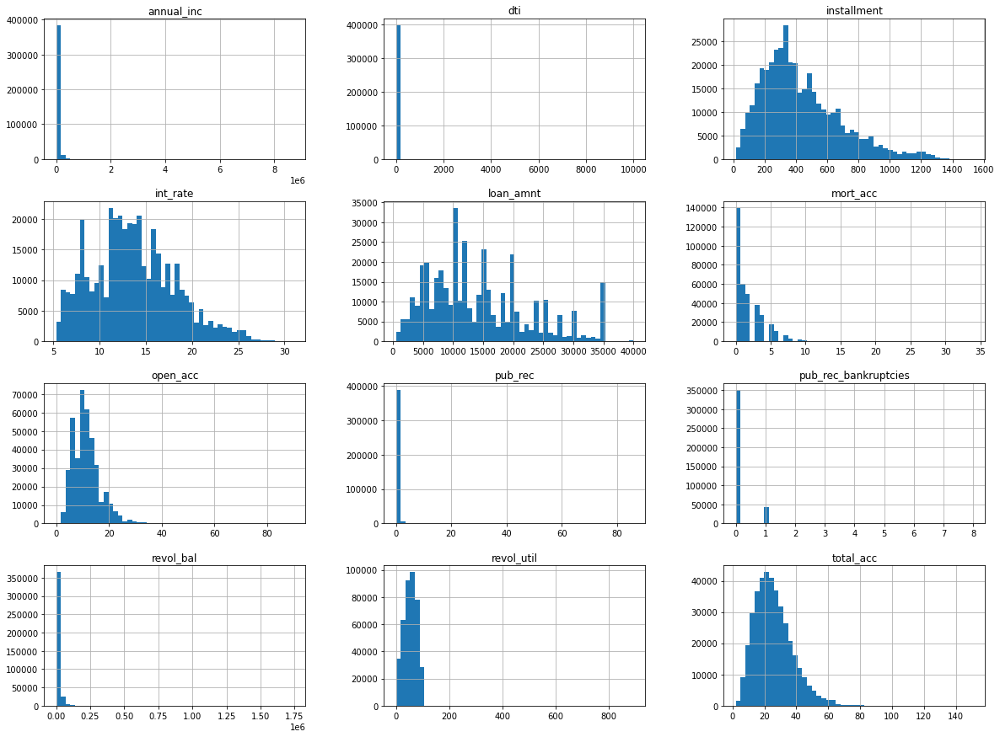

In [32]:
df.hist(bins=50, figsize=(20,15));

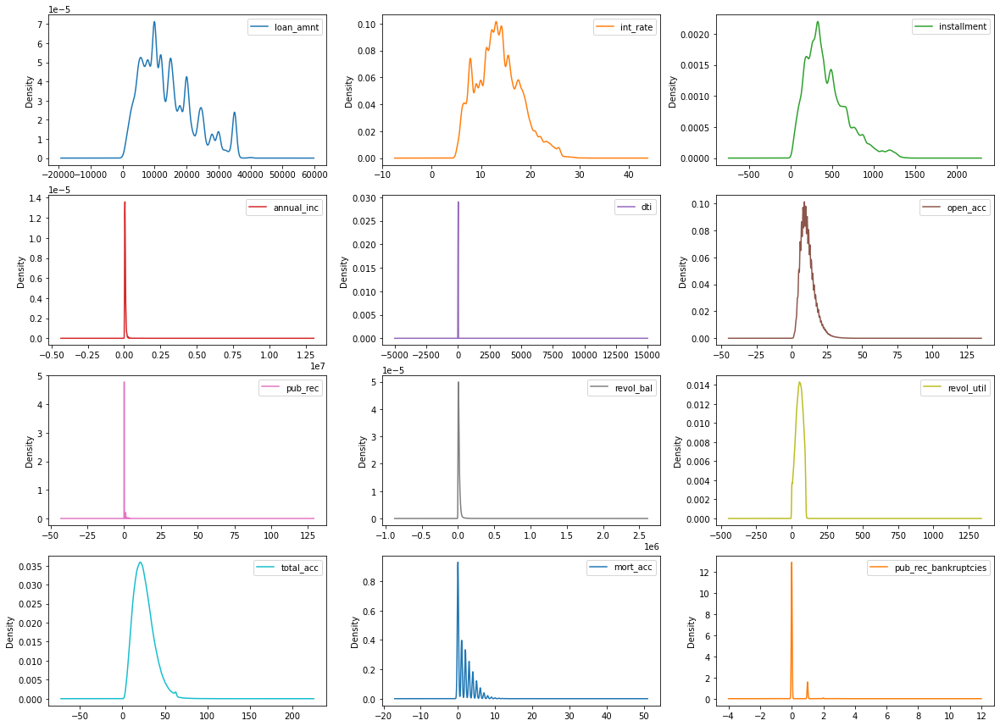

In [33]:
df.plot(kind='density', subplots=True, layout=(4,3), sharex=False, figsize=(20,15));

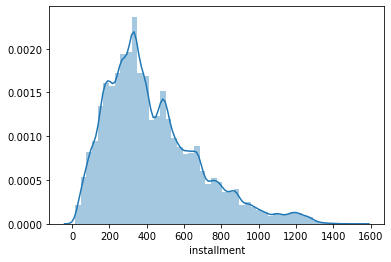

In [34]:
sns.distplot(df['installment']);

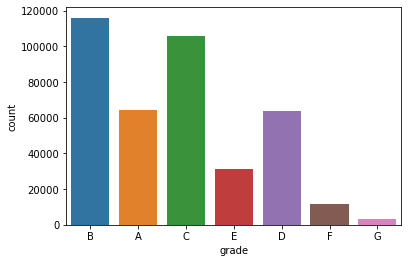

In [35]:
sns.countplot(x='grade',data=df);

#### Skew of Univariate Distributions

Skew refers to a distribution that is assumed Gaussian (normal or bell curve) that is shifted or squashed in one direction or another. Many machine learning algorithms assume a Gaussian distribution. Knowing that an attribute has a skew may allow you to perform data preparation to correct the skew and later improve the accuracy of your models.

In [36]:
skew = df.skew()
print(skew)

loan_amnt                 0.7773
int_rate                  0.4207
installment               0.9836
annual_inc               41.0427
dti                     431.0512
open_acc                  1.2130
pub_rec                  16.5766
revol_bal                11.7275
revol_util               -0.0718
total_acc                 0.8643
mort_acc                  1.6001
pub_rec_bankruptcies      3.4234
dtype: float64


The skew results show a positive (right) or negative (left) skew. Values closer to zero show less skew.

## Outliers

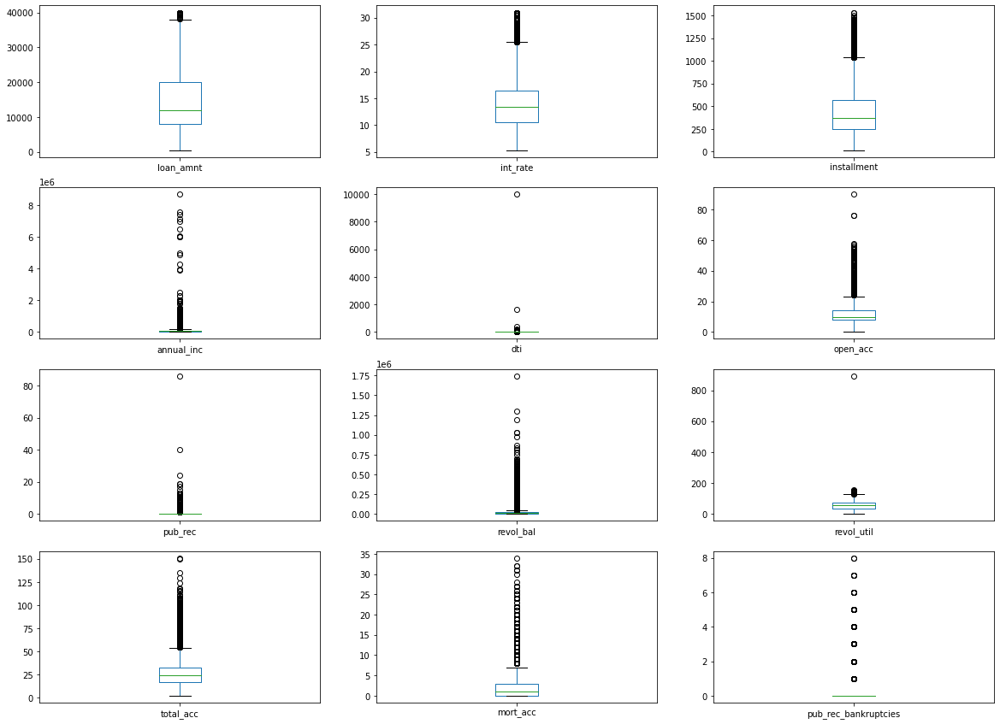

In [37]:
df.plot(kind='box', subplots=True, layout=(4,3), sharex=False, sharey=False, figsize=(20,15));

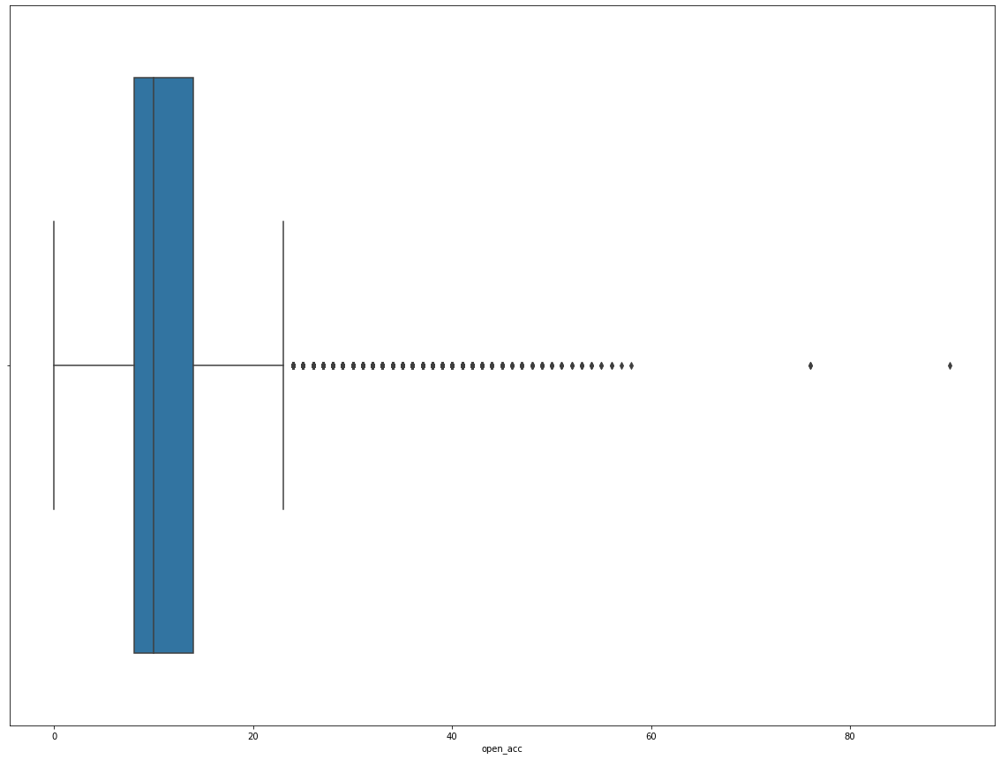

In [38]:
plt.figure(figsize=(20,15));
sns.boxplot(x='open_acc', data=df);

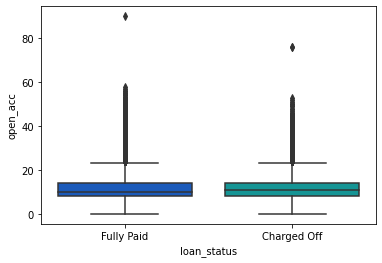

In [39]:
sns.boxplot(y="open_acc", x='loan_status', data=df, palette='winter');

## Correlation

**Degree of correlation:**
1.	**Perfect:** If the value is near ± 1, then it said to be a perfect correlation: as one variable increases, the other variable tends to also increase (if positive) or decrease (if negative).
2.	**High degree:** If the coefficient value lies between ± 0.50 and ± 1, then it is said to be a strong correlation.
3.	**Moderate degree:** If the value lies between ± 0.30 and ± 0.49, then it is said to be a medium correlation.
4.	**Low degree:** When the value lies below + .29, then it is said to be a small correlation.
5.	**No correlation:** When the value is zero.

In [40]:
# calculate correlation matrix
corr = df.corr()

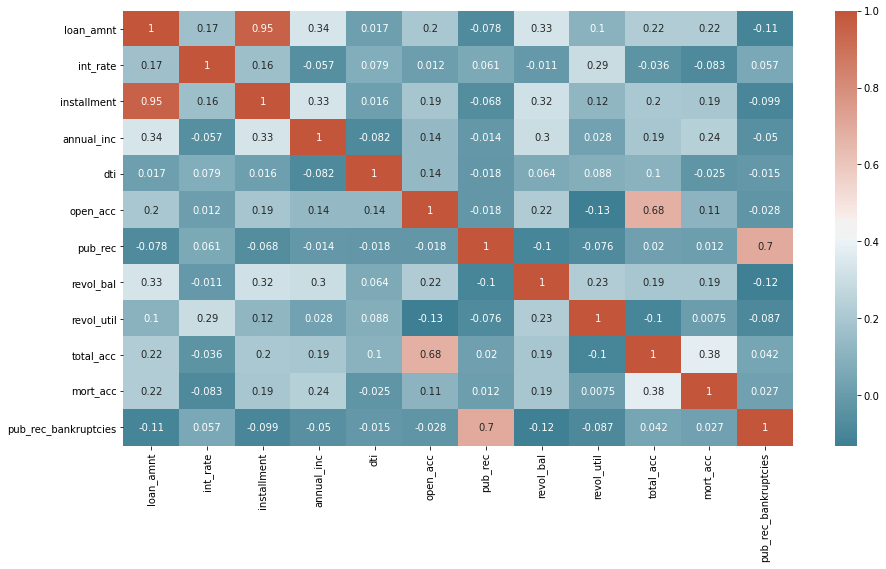

In [41]:
# plot the heatmap
plt.figure(figsize=(15,8))
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, annot=True, 
            cmap=sns.diverging_palette(220, 20, as_cmap=True)); #cmap='viridis'

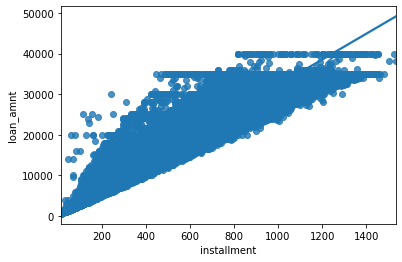

In [42]:
sns.regplot(x="installment", y="loan_amnt", data=df);

In [43]:
corr

,loan_amnt,int_rate,installment,annual_inc,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies
loan_amnt,1.0000,0.1689,0.9539,0.3369,0.0166,0.1986,-0.0778,0.3283,0.0999,0.2239,0.2223,-0.1065
int_rate,0.1689,1.0000,0.1628,-0.0568,0.0790,0.0116,0.0610,-0.0113,0.2937,-0.0364,-0.0826,0.0575
installment,0.9539,0.1628,1.0000,0.3304,0.0158,0.1890,-0.0679,0.3165,0.1239,0.2024,0.1937,-0.0986
annual_inc,0.3369,-0.0568,0.3304,1.0000,-0.0817,0.1362,-0.0137,0.2998,0.0279,0.1930,0.2363,-0.0502
dti,0.0166,0.0790,0.0158,-0.0817,1.0000,0.1362,-0.0176,0.0636,0.0884,0.1021,-0.0254,-0.0146
open_acc,0.1986,0.0116,0.1890,0.1362,0.1362,1.0000,-0.0184,0.2212,-0.1314,0.6807,0.1092,-0.0277
pub_rec,-0.0778,0.0610,-0.0679,-0.0137,-0.0176,-0.0184,1.0000,-0.1017,-0.0759,0.0197,0.0116,0.6994
revol_bal,0.3283,-0.0113,0.3165,0.2998,0.0636,0.2212,-0.1017,1.0000,0.2263,0.1916,0.1949,-0.1245
revol_util,0.0999,0.2937,0.1239,0.0279,0.0884,-0.1314,-0.0759,0.2263,1.0000,-0.1043,0.0075,-0.0868
total_acc,0.2239,-0.0364,0.2024,0.1930,0.1021,0.6807,0.0197,0.1916,-0.1043,1.0000,0.3811,0.0420


In [44]:
df_temp = df.copy()
df_temp['loan_status'] = df_temp['loan_status'].map({'Fully Paid':0,'Charged Off':1})
df_temp.corr()['loan_status'].sort_values(ascending=False).drop('loan_status')

int_rate                0.2478
revol_util              0.0824
dti                     0.0624
loan_amnt               0.0598
installment             0.0411
open_acc                0.0280
pub_rec                 0.0199
pub_rec_bankruptcies    0.0094
revol_bal              -0.0109
total_acc              -0.0179
annual_inc             -0.0534
mort_acc               -0.0731
Name: loan_status, dtype: float64

In [45]:
pearson_coef, p_value = stats.pearsonr(df_temp['installment'], df_temp['loan_status'])
print(pearson_coef)
print(p_value)

0.04108213720232157
1.6844011434421048e-147


In [46]:
pearson_coef, p_value = stats.pearsonr(df_temp['loan_amnt'], df_temp['installment'])
print(pearson_coef)
print(p_value)

0.9539289082616207
0.0


## Pandas Profiling

In [47]:
from pandas_profiling import ProfileReport

In [48]:
profile = ProfileReport(df_temp, title='Pandas Profiling Report', explorative=True)

In [49]:
profile.to_file("loan_defaulter_pandas_profiling.html")

In [50]:
profile.to_notebook_iframe()

## Sweetviz Profiling

In [51]:
import sweetviz as sv

In [52]:
my_report = sv.analyze(df_temp)
my_report.show_html('loan_defaulter_sv_profiling.html') # Default arguments will generate to "SWEETVIZ_REPORT.html"


Report loan_defaulter_sv_profiling.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



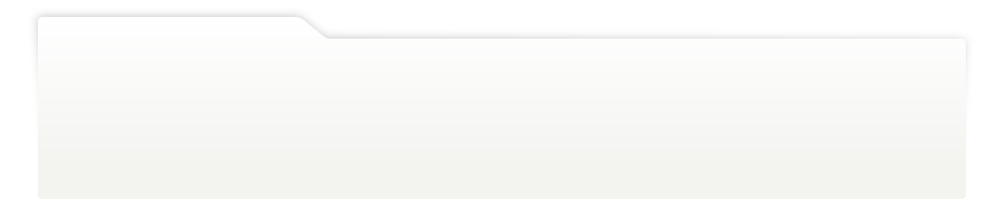
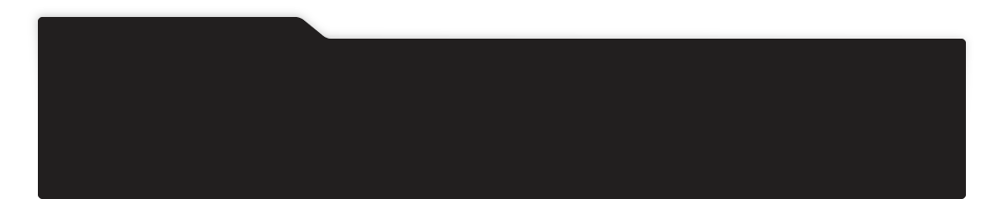
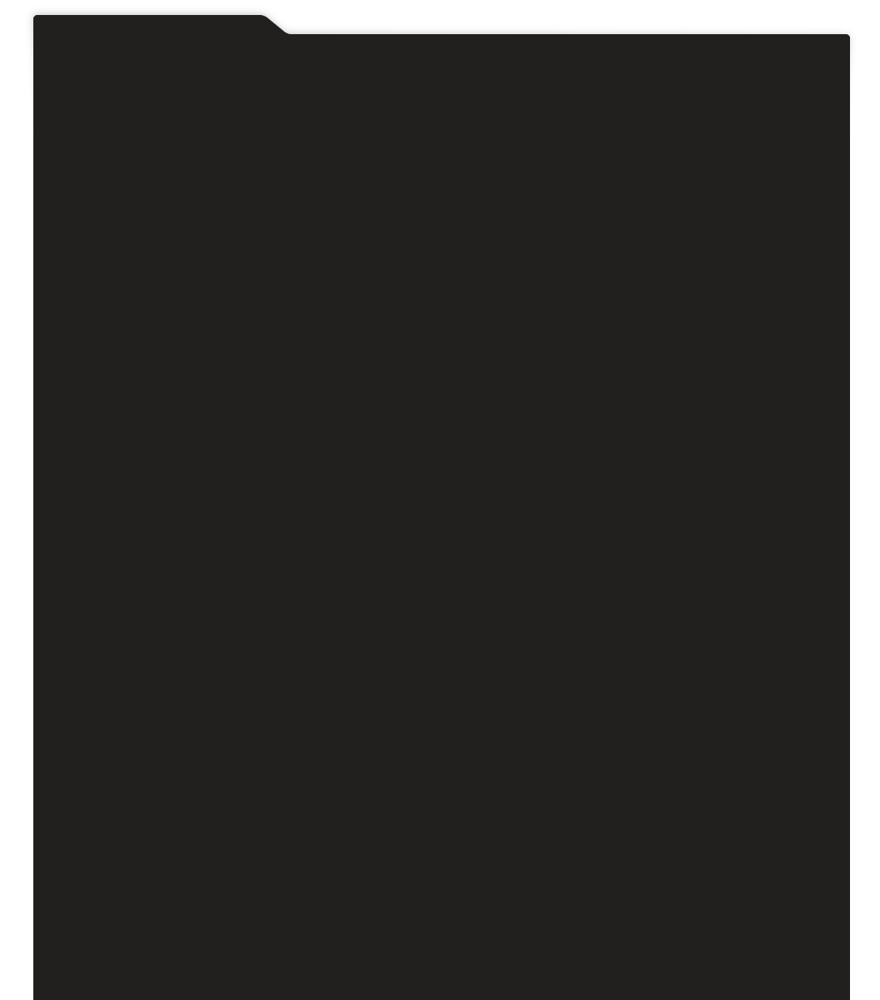
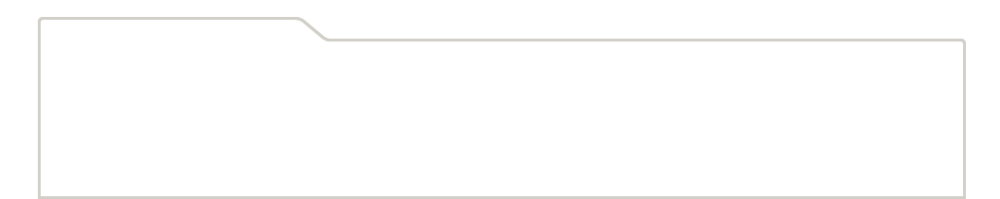
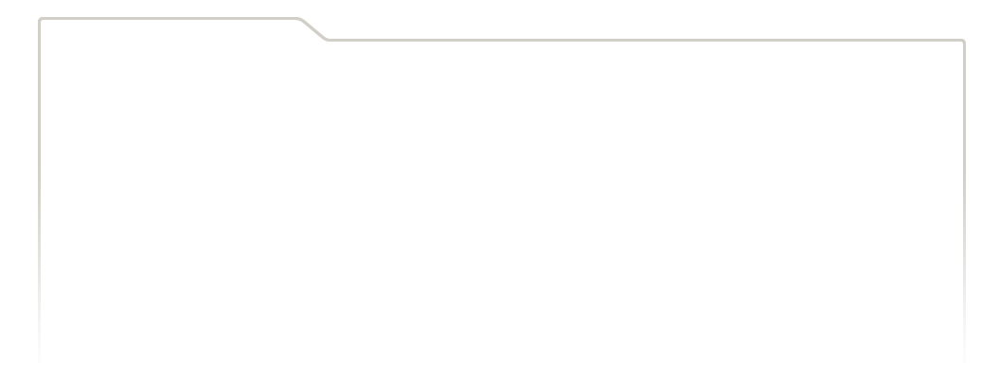
...
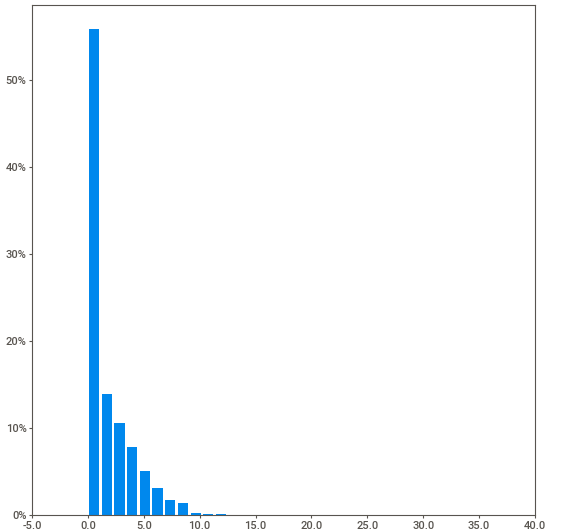
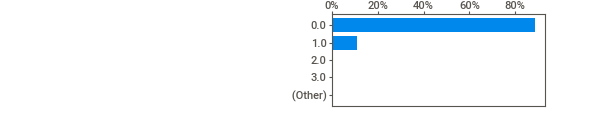
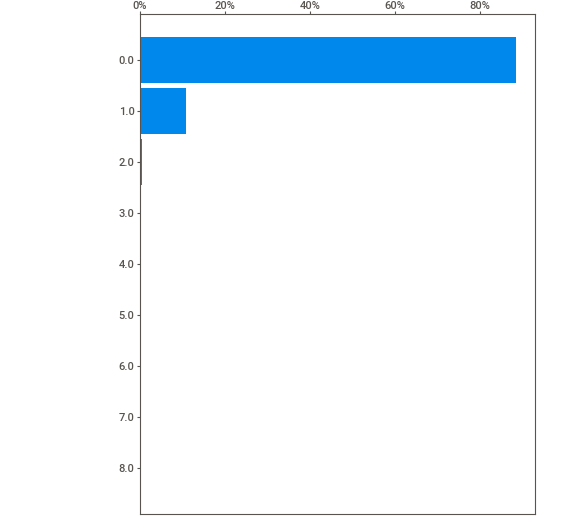
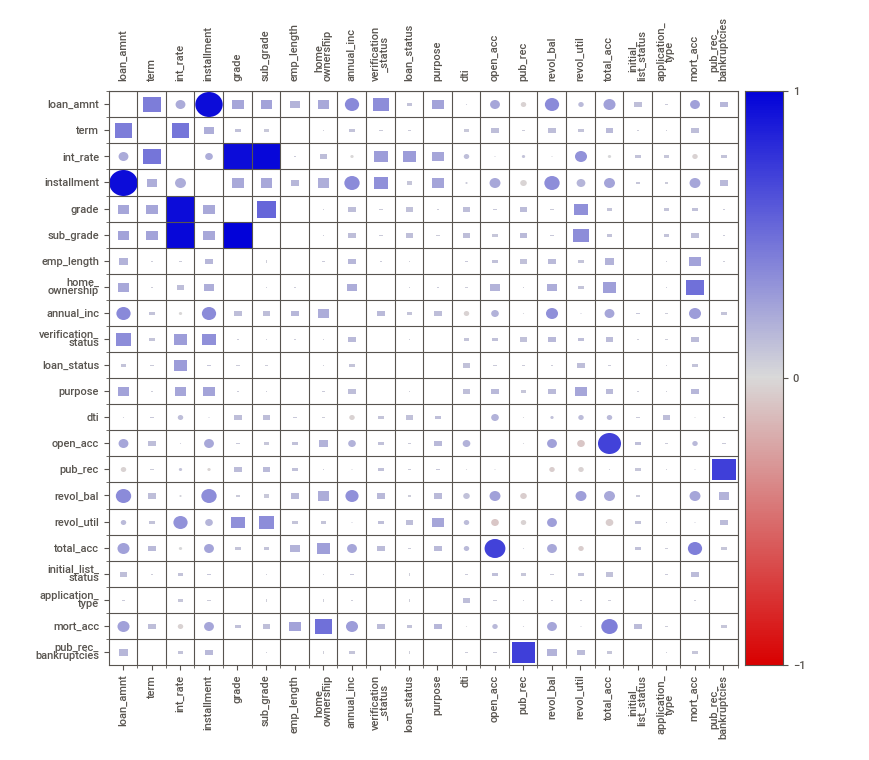
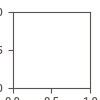

In [53]:
my_report.show_notebook(  w='100%', 
                h='Full', 
                scale=0.8,
                layout='widescreen')